# Vector DB Test

벡터디비 활용을 통해 임베딩 데이터 저장 및 검색 테스트<br>
>임베딩 추출 시간 절약, 데이터 저장 및 검색 효율성 증대 목적

## milvus test

오픈소스 벡터디비 milvus의 경량화 버전 milvus-lite 구동 테스트<br>
> 파이썬 연결 지원, 파일 기반 데이터 제어, 로컬 환경 구축

### milvus client 실행

In [2]:
import fiftyone as fo

fo.list_datasets()

['noise_composite_current',
 'noise_composite_merged',
 'noise_composite_pred',
 'tunelpdr_merged_all']

In [3]:
dataset = fo.load_dataset("noise_composite_merged")
sample = dataset.first()

sample.get_field_schema()

OrderedDict([('id', <fiftyone.core.fields.ObjectIdField at 0x7fe0c58db440>),
             ('filepath',
              <fiftyone.core.fields.StringField at 0x7fe0c64c3a40>),
             ('tags', <fiftyone.core.fields.ListField at 0x7fe0c62a4680>),
             ('metadata',
              <fiftyone.core.fields.EmbeddedDocumentField at 0x7fe0c60149e0>),
             ('created_at',
              <fiftyone.core.fields.DateTimeField at 0x7fe0c6215340>),
             ('last_modified_at',
              <fiftyone.core.fields.DateTimeField at 0x7fe0c63fc0e0>),
             ('ground_truth',
              <fiftyone.core.fields.EmbeddedDocumentField at 0x7fe0c58db590>),
             ('source', <fiftyone.core.fields.StringField at 0x7fe0cc957860>),
             ('clip_embeddings',
              <fiftyone.core.fields.ListField at 0x7fe0c60d7680>)])

In [4]:
print(sample.id)
print(len(sample.id))
print(type(sample.id))

67c91348df3013a998789607
24
<class 'str'>


In [5]:
from pymilvus import MilvusClient
from pymilvus import connections, FieldSchema, CollectionSchema, DataType, Collection

db_client = MilvusClient("../db/DAE_data.db")

schema = db_client.create_schema(
    auto_id=False,
    enable_dynamic_field=True,
)
schema.add_field(field_name="sample_id", datatype=DataType.VARCHAR, is_primary=True, max_length=24)
schema.add_field(field_name="embedding", datatype=DataType.FLOAT_VECTOR, dim=512)

db_client.create_collection(
    collection_name="test_collection",
    schema=schema
)
res = db_client.get_load_state(collection_name="test_collection")
print(res)

{'state': <LoadState: NotLoad>}


In [13]:
db_client.list_collections()

['test_collection']

In [14]:
db_client.load_collection(collection_name="test_collection")
print(db_client.get_load_state(collection_name="test_collection"))

{'state': <LoadState: Loaded>}


### 데이터 삽입 테스트

In [6]:
print(type(sample))
print(sample.clip_embeddings)
print(type(sample.clip_embeddings))

<class 'fiftyone.core.sample.Sample'>
[-0.16796875, -0.5458984375, 0.01401519775390625, 0.0887451171875, -0.2265625, -0.35107421875, 0.1907958984375, 0.7919921875, 0.2259521484375, -0.1925048828125, 0.310791015625, -0.01157379150390625, -0.06573486328125, 0.284912109375, -0.361328125, -0.305908203125, -0.50341796875, -0.046356201171875, 0.2213134765625, -0.1453857421875, 0.035858154296875, 0.344482421875, -0.00182342529296875, 0.1048583984375, -0.08221435546875, -0.11590576171875, -0.1595458984375, -0.404052734375, 0.440185546875, -0.08111572265625, 0.3642578125, -0.02398681640625, -0.08966064453125, -0.3193359375, -0.349853515625, -0.1917724609375, 0.3037109375, 0.11138916015625, 0.80322265625, 0.92431640625, -0.0288238525390625, -0.2108154296875, -0.51806640625, -0.06768798828125, 0.10906982421875, -0.0323486328125, 0.319091796875, 0.414794921875, 0.35498046875, -0.310546875, 0.12548828125, 0.06976318359375, 0.08294677734375, -0.20703125, -0.298095703125, -0.394775390625, 0.576660156

In [7]:
from tqdm import tqdm

data = []

for sample in tqdm(dataset):
    tmp_dict = {
        "sample_id": sample.id,
        "embedding": sample.clip_embeddings
    }
    data.append(tmp_dict)

print(len(data))

100%|██████████| 38376/38376 [00:38<00:00, 1008.40it/s]

38376


In [16]:
print(type(dataset.name))
print(dataset.name)

<class 'str'>
noise_composite_merged


In [17]:
res = db_client.insert(
    collection_name="test_collection",
    parition_name=dataset.name,
    data=data,
)
print(res)

{'insert_count': 38376, 'ids': ['67c91348df3013a998789607', '67c91348df3013a998789614', '67c91348df3013a998789615', '67c91348df3013a998789616', '67c91348df3013a998789617', '67c91348df3013a998789618', '67c91348df3013a998789619', '67c91348df3013a99878961a', '67c91348df3013a99878961b', '67c91348df3013a998789671', '67c91348df3013a998789672', '67c91348df3013a998789673', '67c91348df3013a998789674', '67c91348df3013a998789675', '67c91348df3013a998789676', '67c91348df3013a998789677', '67c91348df3013a998789678', '67c91348df3013a998789679', '67c91348df3013a99878967a', '67c91348df3013a99878967b', '67c91348df3013a99878967c', '67c91348df3013a99878967d', '67c91348df3013a99878967e', '67c91348df3013a99878967f', '67c91348df3013a998789680', '67c91348df3013a998789681', '67c91348df3013a998789682', '67c91348df3013a998789683', '67c91348df3013a998789684', '67c91348df3013a998789685', '67c91348df3013a998789686', '67c91348df3013a998789687', '67c91348df3013a998789688', '67c91348df3013a998789689', '67c91348df3013a

In [28]:
res = db_client.get(
    collection_name="test_collection",
    partition_names=dataset.name,
    ids=dataset.first().id
)
print(res)

data: ["{'sample_id': '67c91348df3013a998789607', 'embedding': [np.float32(-0.16796875), np.float32(-0.54589844), np.float32(0.014015198), np.float32(0.08874512), np.float32(-0.2265625), np.float32(-0.35107422), np.float32(0.1907959), np.float32(0.7919922), np.float32(0.22595215), np.float32(-0.19250488), np.float32(0.31079102), np.float32(-0.0115737915), np.float32(-0.06573486), np.float32(0.2849121), np.float32(-0.36132812), np.float32(-0.3059082), np.float32(-0.50341797), np.float32(-0.0463562), np.float32(0.22131348), np.float32(-0.14538574), np.float32(0.035858154), np.float32(0.34448242), np.float32(-0.0018234253), np.float32(0.1048584), np.float32(-0.082214355), np.float32(-0.11590576), np.float32(-0.1595459), np.float32(-0.40405273), np.float32(0.44018555), np.float32(-0.08111572), np.float32(0.3642578), np.float32(-0.023986816), np.float32(-0.089660645), np.float32(-0.31933594), np.float32(-0.34985352), np.float32(-0.19177246), np.float32(0.30371094), np.float32(0.11138916), n

In [31]:
print(dataset.first().clip_embeddings[0])
print(dataset.first().clip_embeddings[1])
print(dataset.first().clip_embeddings[2])

-0.16796875
-0.5458984375
0.01401519775390625


## DB 클라이언트 구동 및 데이터 제어 테스트 #2

* partition 대용량 데이터 제어 문제 : collection 단위로 데이터 집합 사용
* index 추가

### collection 제어 테스트

In [35]:
db_client.drop_collection(collection_name="test_collection")

res = db_client.list_collections()


In [ ]:
index_params = db_client.prepare_index_params()
index_params.add_index(
    field_name="embedding",
    index_type='AUTOINDEX',
    metric_type="COSINE",
)

db_client.create_collection(
    collection_name=dataset.name,
    schema=schema,
    index_params=index_params,
)
res = db_client.get_load_state(collection_name=dataset.name)
print(res)

{'state': <LoadState: Loaded>}


In [38]:
res = db_client.list_collections()
print(res)

['noise_composite_merged']


In [40]:
res = db_client.describe_collection(collection_name=dataset.name)
print(res)

{'collection_name': 'noise_composite_merged', 'auto_id': False, 'num_shards': 0, 'description': '', 'fields': [{'field_id': 100, 'name': 'sample_id', 'description': '', 'type': <DataType.VARCHAR: 21>, 'params': {'max_length': 24}, 'is_primary': True}, {'field_id': 101, 'name': 'embedding', 'description': '', 'type': <DataType.FLOAT_VECTOR: 101>, 'params': {'dim': 512}}], 'functions': [], 'aliases': [], 'collection_id': 0, 'consistency_level': 0, 'properties': {}, 'num_partitions': 0, 'enable_dynamic_field': True}


In [41]:
from tqdm import tqdm

data = []
for sample in tqdm(dataset):
    tmp_dict = {
        "sample_id": sample.id,
        "embedding": sample.clip_embeddings
    }
    data.append(tmp_dict)

db_client.insert(
    collection_name=dataset.name,
    data=data,
)

100%|██████████| 38376/38376 [00:37<00:00, 1014.15it/s]


{'insert_count': 38376, 'ids': ['67c91348df3013a998789607', '67c91348df3013a998789614', '67c91348df3013a998789615', '67c91348df3013a998789616', '67c91348df3013a998789617', '67c91348df3013a998789618', '67c91348df3013a998789619', '67c91348df3013a99878961a', '67c91348df3013a99878961b', '67c91348df3013a998789671', '67c91348df3013a998789672', '67c91348df3013a998789673', '67c91348df3013a998789674', '67c91348df3013a998789675', '67c91348df3013a998789676', '67c91348df3013a998789677', '67c91348df3013a998789678', '67c91348df3013a998789679', '67c91348df3013a99878967a', '67c91348df3013a99878967b', '67c91348df3013a99878967c', '67c91348df3013a99878967d', '67c91348df3013a99878967e', '67c91348df3013a99878967f', '67c91348df3013a998789680', '67c91348df3013a998789681', '67c91348df3013a998789682', '67c91348df3013a998789683', '67c91348df3013a998789684', '67c91348df3013a998789685', '67c91348df3013a998789686', '67c91348df3013a998789687', '67c91348df3013a998789688', '67c91348df3013a998789689', '67c91348df3013a

In [42]:
db_client.list_collections()

['noise_composite_merged']

In [44]:
dataset.first().id

'67c91348df3013a998789607'

### 데이터 조회

In [48]:
# 특정 sample_id로 데이터 조회
sample_id_to_query = dataset.first().id
query_results = db_client.get(
    collection_name="noise_composite_merged",
    ids=[sample_id_to_query],
    output_fields=["sample_id", "embedding"],
)

# 결과 출력
for result in query_results:
    print(f"Sample ID: {result['sample_id']}, Embedding: {result['embedding']}")

Sample ID: 67c91348df3013a998789607, Embedding: [np.float32(-0.16796875), np.float32(-0.54589844), np.float32(0.014015198), np.float32(0.08874512), np.float32(-0.2265625), np.float32(-0.35107422), np.float32(0.1907959), np.float32(0.7919922), np.float32(0.22595215), np.float32(-0.19250488), np.float32(0.31079102), np.float32(-0.0115737915), np.float32(-0.06573486), np.float32(0.2849121), np.float32(-0.36132812), np.float32(-0.3059082), np.float32(-0.50341797), np.float32(-0.0463562), np.float32(0.22131348), np.float32(-0.14538574), np.float32(0.035858154), np.float32(0.34448242), np.float32(-0.0018234253), np.float32(0.1048584), np.float32(-0.082214355), np.float32(-0.11590576), np.float32(-0.1595459), np.float32(-0.40405273), np.float32(0.44018555), np.float32(-0.08111572), np.float32(0.3642578), np.float32(-0.023986816), np.float32(-0.089660645), np.float32(-0.31933594), np.float32(-0.34985352), np.float32(-0.19177246), np.float32(0.30371094), np.float32(0.11138916), np.float32(0.803

## 기능 연동

임베딩 추출 단계에서 DB에 데이터 삽입 및 FiftyOne 시각화 기능과 연동

### 임베딩 추출 및 데이터 삽입

데이터셋 생성 시 임베딩을 계산하여 DB에 저장, 필요에 따라 DB를 조회하여 사용

In [1]:
## 임베딩 추출 함수

import torch
from PIL import Image

def get_embeddings(dataset, device, model, preprocess):
    data = []
    
    for sample in tqdm(dataset, desc=f"{dataset.name} 임베딩 계산 중"):
        with torch.no_grad():
            inputs = preprocess(Image.open(sample.filepath)).unsqueeze(0).to(device)
            embedding = model.encode_image(inputs).cpu().numpy().flatten()
            tmp_dict = {
                "sample_id": sample.id,
                "embedding": embedding.tolist()
            }
            data.append(tmp_dict)

    return data

In [2]:
import fiftyone as fo

fo.list_datasets()

['noise_composite_current',
 'noise_composite_merged',
 'noise_composite_pred',
 'tunelpdr_merged_all']

#### 임베딩 인코드

In [3]:
import clip
from tqdm import tqdm

dataset = fo.load_dataset("noise_composite_merged")  
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model, preprocess = clip.load("ViT-B/16", device=device)

data = get_embeddings(dataset, device, model, preprocess)
data

noise_composite_merged 임베딩 계산 중: 100%|██████████| 38376/38376 [09:45<00:00, 65.54it/s]


[{'sample_id': '67c91348df3013a998789607',
  'embedding': [-0.16796875,
   -0.5458984375,
   0.01401519775390625,
   0.0887451171875,
   -0.2265625,
   -0.35107421875,
   0.1907958984375,
   0.7919921875,
   0.2259521484375,
   -0.1925048828125,
   0.310791015625,
   -0.01157379150390625,
   -0.06573486328125,
   0.284912109375,
   -0.361328125,
   -0.305908203125,
   -0.50341796875,
   -0.046356201171875,
   0.2213134765625,
   -0.1453857421875,
   0.035858154296875,
   0.344482421875,
   -0.00182342529296875,
   0.1048583984375,
   -0.08221435546875,
   -0.11590576171875,
   -0.1595458984375,
   -0.404052734375,
   0.440185546875,
   -0.08111572265625,
   0.3642578125,
   -0.02398681640625,
   -0.08966064453125,
   -0.3193359375,
   -0.349853515625,
   -0.1917724609375,
   0.3037109375,
   0.11138916015625,
   0.80322265625,
   0.92431640625,
   -0.0288238525390625,
   -0.2108154296875,
   -0.51806640625,
   -0.06768798828125,
   0.10906982421875,
   -0.0323486328125,
   0.3190917968

In [4]:
len(data)

38376

#### DB 연결 및 데이터 삽입

In [5]:
from pymilvus import MilvusClient
from pymilvus import connections, FieldSchema, CollectionSchema, DataType, Collection
import fiftyone as fo

db_client = MilvusClient("../db/DAE_data.db")

if db_client.has_collection(dataset.name):
    db_client.drop_collection(collection_name=dataset.name)

schema = db_client.create_schema(
    auto_id=False,
    enable_dynamic_field=True,
)
schema.add_field(field_name="sample_id", datatype=DataType.VARCHAR, is_primary=True, max_length=24)
schema.add_field(field_name="embedding", datatype=DataType.FLOAT_VECTOR, dim=512)

index_params = db_client.prepare_index_params()
index_params.add_index(
    field_name="embedding",
    index_type='AUTOINDEX',
    metric_type="COSINE",
)

db_client.create_collection(
    collection_name=dataset.name,
    schema=schema,
    index_params=index_params,
)
db_client.get_load_state(collection_name=dataset.name)

{'state': <LoadState: Loaded>}

In [6]:
db_client.describe_collection(
    collection_name=dataset.name
)

{'collection_name': 'noise_composite_merged',
 'auto_id': False,
 'num_shards': 0,
 'description': '',
 'fields': [{'field_id': 100,
   'name': 'sample_id',
   'description': '',
   'type': <DataType.VARCHAR: 21>,
   'params': {'max_length': 24},
   'is_primary': True},
  {'field_id': 101,
   'name': 'embedding',
   'description': '',
   'type': <DataType.FLOAT_VECTOR: 101>,
   'params': {'dim': 512}}],
 'functions': [],
 'aliases': [],
 'collection_id': 0,
 'consistency_level': 0,
 'properties': {},
 'num_partitions': 0,
 'enable_dynamic_field': True}

In [7]:
db_client.insert(
    collection_name=dataset.name,
    data=data,
)

{'insert_count': 38376, 'ids': ['67c91348df3013a998789607', '67c91348df3013a998789614', '67c91348df3013a998789615', '67c91348df3013a998789616', '67c91348df3013a998789617', '67c91348df3013a998789618', '67c91348df3013a998789619', '67c91348df3013a99878961a', '67c91348df3013a99878961b', '67c91348df3013a998789671', '67c91348df3013a998789672', '67c91348df3013a998789673', '67c91348df3013a998789674', '67c91348df3013a998789675', '67c91348df3013a998789676', '67c91348df3013a998789677', '67c91348df3013a998789678', '67c91348df3013a998789679', '67c91348df3013a99878967a', '67c91348df3013a99878967b', '67c91348df3013a99878967c', '67c91348df3013a99878967d', '67c91348df3013a99878967e', '67c91348df3013a99878967f', '67c91348df3013a998789680', '67c91348df3013a998789681', '67c91348df3013a998789682', '67c91348df3013a998789683', '67c91348df3013a998789684', '67c91348df3013a998789685', '67c91348df3013a998789686', '67c91348df3013a998789687', '67c91348df3013a998789688', '67c91348df3013a998789689', '67c91348df3013a

In [11]:
db_client.get_collection_stats(collection_name=dataset.name)

{'row_count': 38376}

#### 시각화용 데이터 생성

In [19]:
import numpy as np

embeddings_by_sample_id = {}
for d in data:
    embeddings_by_sample_id[d['sample_id']] = np.array(d['embedding'])

print(len(embeddings_by_sample_id))

38376


### 이미 존재하는 데이터셋에서 임베딩 조회

```sample.id```에 대한 ```embedding```값을 조회하여 시각화용 데이터 생성

In [37]:
embeddings_by_sample_id_2 = {}
for sample in dataset:
    query_results = db_client.get(
        collection_name=dataset.name,
        ids=[sample.id],
        output_fields=["sample_id", "embedding"],
    )
    embeddings_by_sample_id_2[sample.id] = np.array(query_results[0]['embedding'])

print(len(embeddings_by_sample_id_2))

38376


In [44]:
print(type(data))
print(type(dataset))


<class 'list'>
<class 'fiftyone.core.dataset.Dataset'>


#### 임베딩 추출 정상 여부 확인

* 딕셔너리 값 비교
* 시각화를 통한 확인

In [41]:
import numpy as np

# 두 딕셔너리의 키가 동일한지 확인
if set(embeddings_by_sample_id.keys()) == set(embeddings_by_sample_id_2.keys()):
    # 각 키에 대해 값을 비교
    all_equal = True
    for key in embeddings_by_sample_id:
        value1 = embeddings_by_sample_id[key]
        value2 = embeddings_by_sample_id_2[key]
        
        # 배열이나 리스트 비교
        if isinstance(value1, np.ndarray) and isinstance(value2, np.ndarray):
            if not np.array_equal(value1, value2):
                all_equal = False
                break
        else:
            if value1 != value2:
                all_equal = False
                break
    
    if all_equal:
        print("두 딕셔너리는 동일합니다.")
    else:
        print("두 딕셔너리는 다릅니다.")
else:
    print("두 딕셔너리는 다릅니다.")

두 딕셔너리는 동일합니다.


In [20]:
import fiftyone.brain as fob

results = fob.compute_visualization(
        dataset,
        embeddings=embeddings_by_sample_id,
        brain_key="clip_embeddings",
        plot_points=True,
        verbose=True,
    )

Generating visualization...


/home/ethicsense/anaconda3/envs/datadrift/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


UMAP( verbose=True)
Wed Mar 12 14:38:21 2025 Construct fuzzy simplicial set
Wed Mar 12 14:38:21 2025 Finding Nearest Neighbors
Wed Mar 12 14:38:21 2025 Building RP forest with 15 trees
Wed Mar 12 14:38:28 2025 NN descent for 15 iterations
	 1  /  15
	 2  /  15
	 3  /  15
	 4  /  15
	Stopping threshold met -- exiting after 4 iterations
Wed Mar 12 14:38:37 2025 Finished Nearest Neighbor Search
Wed Mar 12 14:38:39 2025 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Wed Mar 12 14:38:50 2025 Finished embedding



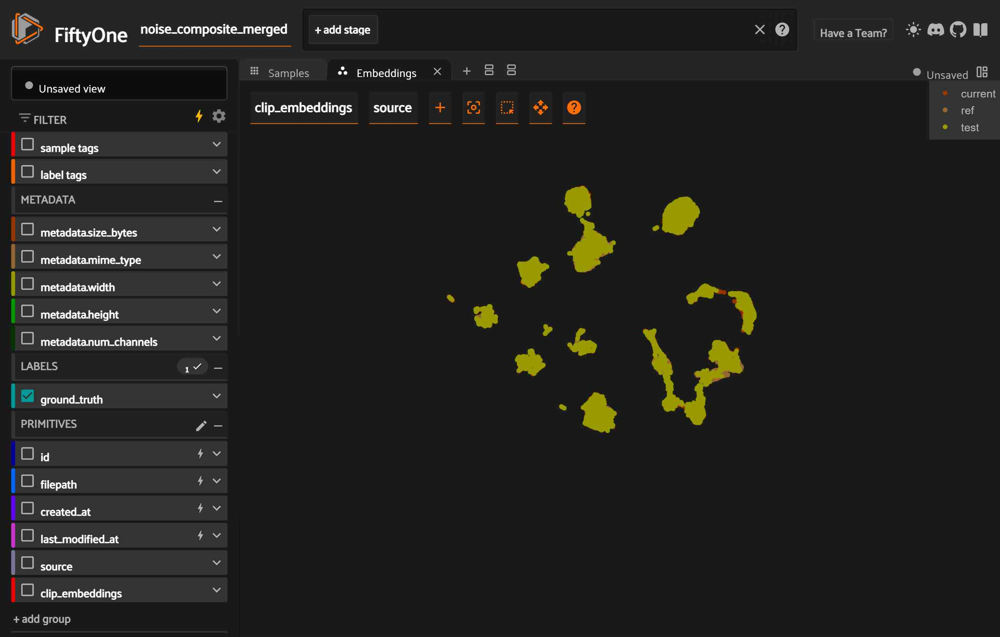

In [21]:
session = fo.launch_app(dataset)

In [42]:
results = fob.compute_visualization(
        dataset,
        embeddings=embeddings_by_sample_id_2,
        brain_key="clip_embeddings",
        plot_points=True,
        verbose=True,
    )

Generating visualization...
UMAP( verbose=True)
Wed Mar 12 16:51:02 2025 Construct fuzzy simplicial set
Wed Mar 12 16:51:02 2025 Finding Nearest Neighbors
Wed Mar 12 16:51:02 2025 Building RP forest with 15 trees


/home/ethicsense/anaconda3/envs/datadrift/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Wed Mar 12 16:51:03 2025 NN descent for 15 iterations
	 1  /  15
	 2  /  15
	 3  /  15
	 4  /  15
	Stopping threshold met -- exiting after 4 iterations
Wed Mar 12 16:51:04 2025 Finished Nearest Neighbor Search
Wed Mar 12 16:51:04 2025 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Wed Mar 12 16:51:17 2025 Finished embedding


In [43]:
session = fo.launch_app(dataset)

### Connection 테스트

flask 앱 적용 시 connection error 발생, 원인 찾는 중

In [3]:
from pymilvus import MilvusClient

client = MilvusClient("../db/DAE_data.db")
client

In [6]:
from pymilvus import connections
connections.list_connections()

[('default', None),
 ('acd35faef6d5449794ca36f1574d1a29',
  <pymilvus.client.grpc_handler.GrpcHandler at 0x7f9d99896420>),
 ('0d94d18b777a410583f24656141d9509',
  <pymilvus.client.grpc_handler.GrpcHandler at 0x7f9dddda9010>)]

In [7]:
connections.disconnect(alias="acd35faef6d5449794ca36f1574d1a29")
connections.disconnect(alias="0d94d18b777a410583f24656141d9509")

In [10]:
client

In [11]:
connections.list_connections()

[('default', None),
 ('acd35faef6d5449794ca36f1574d1a29', None),
 ('0d94d18b777a410583f24656141d9509', None)]

In [18]:
for alias in connections.list_connections():
    connections.remove_connection(alias=alias[0])

print(connections.list_connections())

[]


In [22]:
client = MilvusClient("../db/DAE_data.db")

In [23]:
client.close()

In [24]:
client

#### 부가 작업 : fiftyone dataset 휘발 문제 해결

fiftyone에서 관리하는 데이터셋이 간헐적으로 모두 삭제, 초기화됨

In [3]:
import fiftyone as fo

fo.list_datasets()

[]

In [13]:
dataset = fo.Dataset("save_test", persistent=True)
dataset.save()

fo.list_datasets()

['save_test']

In [14]:
dataset

Name:        save_test
Media type:  None
Num samples: 0
Persistent:  True
Tags:        []
Sample fields:
    id:               fiftyone.core.fields.ObjectIdField
    filepath:         fiftyone.core.fields.StringField
    tags:             fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:         fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.Metadata)
    created_at:       fiftyone.core.fields.DateTimeField
    last_modified_at: fiftyone.core.fields.DateTimeField